# Exploratory Data Analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
from plantclef.config import get_device

print(f"PyTorch Version: {torch.__version__}")
device = get_device()
print(f"Using device: {device}")

PyTorch Version: 2.6.0+cu124
Using device: cuda


In [3]:
import pandas as pd
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path().resolve().parents[0]
print(root)
! date

/storage/home/hcoda1/9/mgustineli3/clef/pytorch-plantclef
Sat Mar 22 06:09:39 PM EDT 2025


In [4]:
# path to data
data_path = f"{root}/data/parquet/"
train_path = f"{data_path}/subset_top5_train"
test_path = f"{data_path}/test_2025_pytorch_webinar"

# read train/test data
train_df = pd.read_parquet(train_path)
test_df = pd.read_parquet(test_path)

# display data
print(train_df.shape)
display(train_df.head(3))
display(test_df.head(3))

(3760, 22)


,species_id,image_name,path,data,organ,obs_id,license,partner,author,altitude,...,gbif_species_id,species,genus,family,dataset,publisher,references,url,learn_tag,image_backup_url
0,1360257,5a4deafc321f2b653f03cc238160a799b0bbb6b7.jpg,/PlantCLEF2024/train/1360257/5a4deafc321f2b653...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,bark,1015292920,cc-by-sa,None,Gabor Graehn,NaN,...,3039454.0,Frangula alnus Mill.,Frangula,Rhamnaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/5a4deafc321f2b...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
1,1360257,a6d9a13ec26cbb04d61861ad5cb4ede8eb4d1ea3.jpg,/PlantCLEF2024/train/1360257/a6d9a13ec26cbb04d...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,bark,1005087257,cc-by-sa,None,Jacco Sanders,51.0,...,3039454.0,Frangula alnus Mill.,Frangula,Rhamnaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/a6d9a13ec26cbb...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
2,1360257,0fec55fc5105e512df08490ecbb55df3393d85c8.jpg,/PlantCLEF2024/train/1360257/0fec55fc5105e512d...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,leaf,4111721487,http://creativecommons.org/licenses/by-nc/4.0/,None,imrsmf,NaN,...,3039454.0,Frangula alnus Mill.,Frangula,Rhamnaceae,gbif,iNaturalist,https://www.inaturalist.org/photos/268971946,https://inaturalist-open-data.s3.amazonaws.com...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...


,image_name,path,data
0,CBN-PdlC-C4-20180723.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...
1,LISAH-BOU-0-30-20230512.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xdb\x00C\x00\x06\x04\x05\x06\x0...
2,CBN-PdlC-C4-20140811.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...


### looking at some images

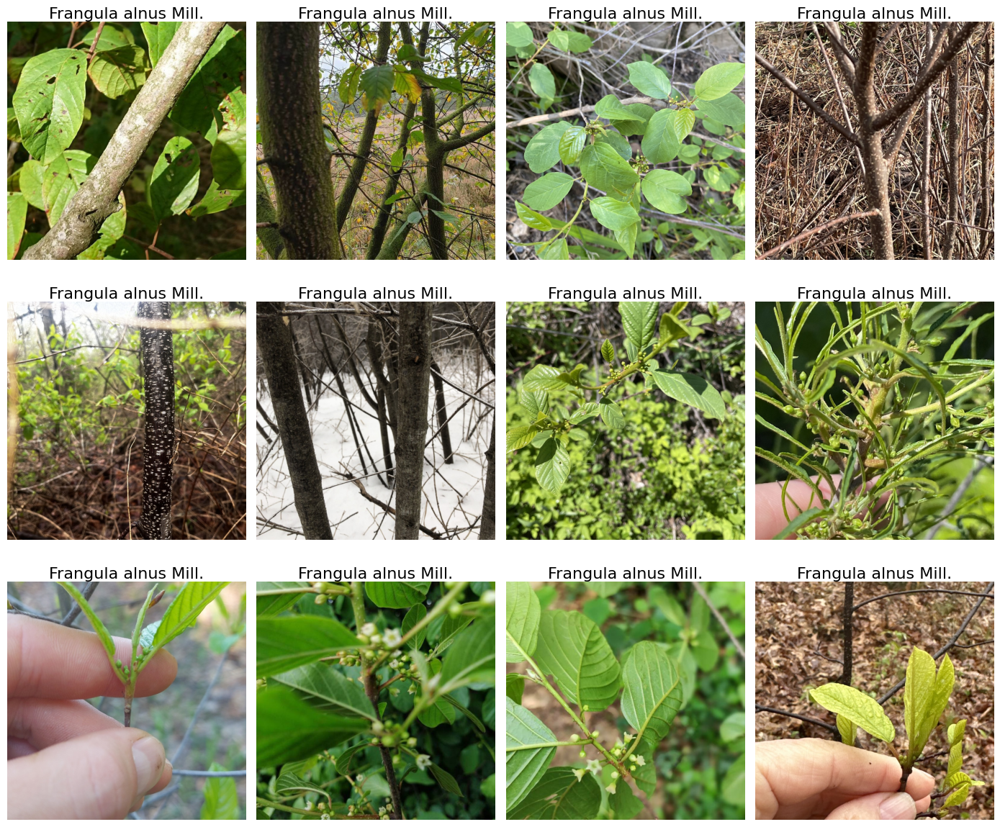

In [5]:
from plantclef.plotting import plot_images_from_binary


plot_images_from_binary(
    train_df,
    data_col="data",
    label_col="species",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

In [6]:
# interesting test images
images = [
    "CBN-Pyr-03-20230706.jpg",
    "OPTMix-012-P2-207-20231201.jpg",
    "OPTMix-0178-P1-661-20231006.jpg",
    "OPTMix-0333-P2-115-20231212.jpg",
    "OPTMix-0598-P4-104-20231207.jpg",
    "RNNB-1-4-20240117.jpg",
    "RNNB-1-7-20230512.jpg",
    "RNNB-1-8-20230512.jpg",
    "RNNB-4-2-20240118.jpg",
    "RNNB-8-8-20240118.jpg",
    "CBN-can-E6-20230706.jpg",
    "CBN-Pla-A3-20140812.jpg",
]

In [7]:
# select subset of test dataframe
subset_test_df = test_df[test_df["image_name"].isin(images)]
subset_test_df.count()  # 12 images

image_name    12
path          12
data          12
dtype: int64

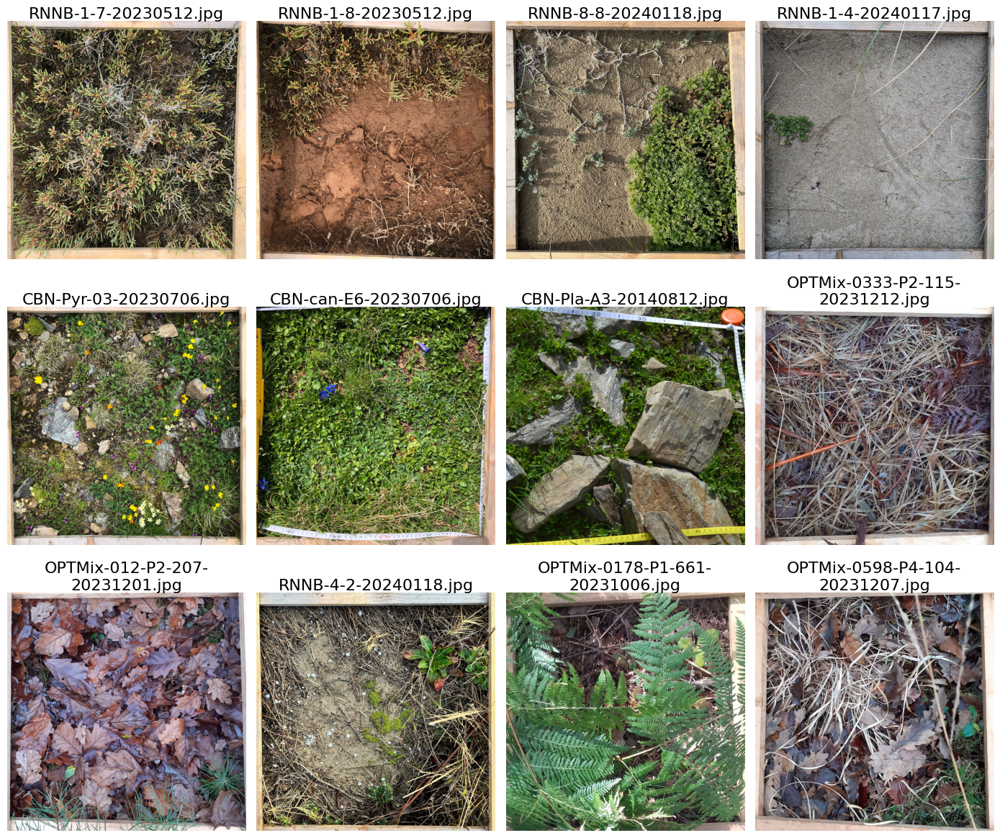

In [8]:
# display the images in a grid with binomial names
plot_images_from_binary(
    subset_test_df,
    data_col="data",
    label_col="image_name",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

## grid of image tiles

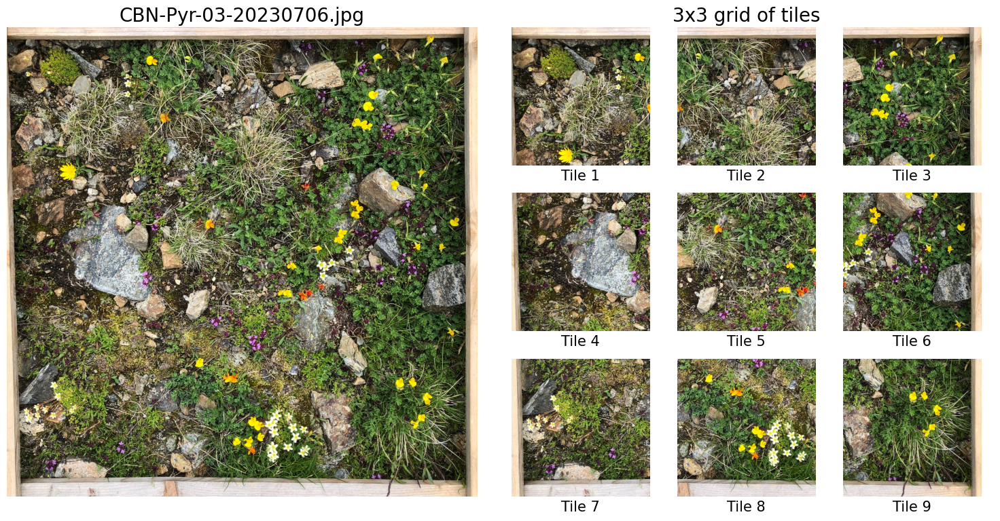

In [9]:
from plantclef.plotting import plot_image_tiles

# select image from test set
image_name = "CBN-Pyr-03-20230706.jpg"
test_image_df = test_df[test_df["image_name"] == image_name]

plot_image_tiles(
    test_image_df,
    data_col="data",
    grid_size=3,
)

In [10]:
test_df.count()

image_name    200
path          200
data          200
dtype: int64